In [91]:
import pandas as pd
import numpy as np
import json
import seaborn
import re
import requests
from bs4 import BeautifulSoup as bsopa
from shapely import geometry
from bokeh.io import show
from bokeh.models import LogColorMapper, LinearColorMapper, HoverTool, ColumnDataSource,PanTool, ResetTool
from bokeh.plotting import figure
from bokeh.io import show, output_notebook, output_file
from bokeh.models import (
    GeoJSONDataSource,
    HoverTool,
    LinearColorMapper,
    LogColorMapper,
    Plot
)
from bokeh.plotting import figure
from bokeh.palettes import Spectral11 as palette 
import collections
from collections import defaultdict

from PIL import Image
from pdf2image import convert_from_path

# -________Data_________-
mineral_deps=pd.read_csv('mrds.csv',low_memory=False,index_col=False) #consider chunking then do a loop 
mineral_dep=mineral_deps.iloc[:,[1,4,5,6,8,9,11,12,13,14,19,23]] #,24,32,33]]


In [2]:
output_notebook() # to inline graphs/plots

Loading BokehJS ...

In [3]:
def unique_minerals_(list1): #Unique Pandas.Series of Mineral Commodities[1,2,3]
    array=np.array(list1.fillna('').str.split(',').apply(lambda x: [i.strip() for i in x]))
    q=set(x for l in array for x in l)
    unique_list = []       
    for x in q: 
#         # check if exists in unique_list or not 
        if x not in unique_list: 
            unique_list.append(x) 
    return unique_list

mineral_commod01=unique_minerals_(mineral_dep.commod1)
mineral_commod02=unique_minerals_(mineral_dep.commod2)
mineral_commod03=unique_minerals_(mineral_dep.commod3)

mineral_commod=set(mineral_commod01+mineral_commod02+mineral_commod03+['NaN'])
# mineral_commod

In [4]:
#-------------------- Mineral_name_list-----------
rege=re.compile(r'[a-zA-Z_()]+')
mineral_list=pd.read_table('Mineral_name_list',index_col=False,header=None)
e=[]
mineral_list=mineral_list.apply(lambda x: x.astype(str).str.lower())
mineral_name_parse=re.sub(r'\([^)]*\)+', '',str(mineral_list))
p=mineral_name_parse.split()
y=' '.join(p)
ui=re.compile(r'([^\d])')
bb=ui.findall(y)

final_mineral_names=''.join(bb)

final_mineral_names=final_mineral_names.split()


#-------------------- Web-scrape another dataset for just minerals and append to other list-------
rsp = requests.get('https://www.minerals.net/Varieties-OtherNames/all.aspx')
rsp.status_code
soupify = bsopa(rsp.text, 'lxml')
f=soupify.get_text()[6391:24731]
f=f.replace('\n\n\n\n\xa0',' ')
minerals_new_file=f.split()

#---------------- Needed another list which has things not shown in final_mineral_names:

mineral_metal_list=pd.read_table('mineral_metal_list.txt',index_col=False,header=None)
mineral_metal=mineral_metal_list.apply(lambda x: x.astype(str).str.lower())
mineral_metal.columns=['names']
mineral_metal=list(mineral_metal.names.unique())

#-------------------- Combining minerals with metals and final_mineral_names:---------

combined_mineral_metals=[*mineral_metal,*final_mineral_names]
combined_mineral_metals=sorted(combined_mineral_metals)
full_mineral_junk=[*combined_mineral_metals,*minerals_new_file]
full_mineral=sorted(set(full_mineral_junk))

#------------------------------- Periodic table of Elements---------

periodic=requests.get('https://www.sigmaaldrich.com/technical-documents/articles/biology/periodic-table-of-elements-names.html')
periodic.status_code
sopify = bsopa(periodic.text, 'lxml')
ff=sopify.get_text()[6582:8319]
ff=ff.replace('\n',' ')

c=re.compile(r'([^\d])')
cc=c.findall(ff)
cc=''.join(cc)
cc=cc.split()
Periodic_table=sorted(set([*cc,*full_mineral]))

#-------------------- Master list of Minerals and Metals and Gems
d=[]
def fcn_(x,y):
    for i in x:
        sub="".join(i)
        s=" ".join(s for s in y if sub.lower() in s.lower())
        d.append(s)
    return d
z=fcn_(Periodic_table,mineral_commod)


In [5]:
def list_consolidated_minerals(z):
    q=' '.join(z)

    x=[]
    for i in q.split(' '):
        if i not in x:
            x.append(i)
    c=x
    f=['Yttrium','Tin','Pyrite','Tripoli','Manganese','Iron','Ball Clay','Fullers Earth','Sulfuric Acid',
      'Sodium', 'Sodium Sulfate','High Calcium', 'Petroleum (Oil)','Rock Asphalt','Semiprecious Gemstone',
      'Pig Iron','Oil Shale','Oil Sands','NaN']
    master_comparison_list=c+f
    ql=(set(sorted(master_comparison_list)))

    v=[]
    for i in ql: 
        if i in mineral_commod01:
            v.append(i)
    return v
Minerals_consolidated_list=sorted(list_consolidated_minerals(z))



In [6]:
mineral_dep=mineral_dep.fillna('')
v=Minerals_consolidated_list
for g in v:
    array=mineral_dep.commod1.map(lambda x: g in x.split(','))
    mineral_dep[g]=array
# mineral_dep


In [7]:
# Creating a GeoJson Object from a Dataframe: Citation below on code formatting/ Great Help!!

df=mineral_dep
def df_to_geojson(df, properties, lat='latitude', lon='longitude'):
    geojson = {'type':'FeatureCollection','features':[]}
    
    for _, row in df.iterrows():
        feature = {'type':'Feature',
                   'properties':{},
                   'geometry':{'type':'Point',
                               'coordinates':[]}}
        feature['geometry']['coordinates'] = [row[lon],row[lat]]
        for prop in properties:
            feature['properties'][prop] = row[prop]
        geojson['features'].append(feature)
    return geojson
cols = ['site_name','state','commod1','country','latitude','longitude']

geojson_minerals = df_to_geojson(df, cols)
# geojson_minerals

In [25]:
uranium=mineral_dep.loc[mineral_dep['Uranium'] == True]
df=uranium
Uranium_geojson=df_to_geojson(df, cols)
Uranium_geojson


{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'site_name': 'Cone Mountain',
    'state': 'Alaska',
    'commod1': 'Uranium',
    'country': 'United States',
    'latitude': 56.51365,
    'longitude': -131.73488999999998},
   'geometry': {'type': 'Point',
    'coordinates': [-131.73488999999998, 56.51365]}},
  {'type': 'Feature',
   'properties': {'site_name': "Pieper's Purple Prospect",
    'state': 'Alaska',
    'commod1': 'Uranium, Fluorine-Fluorite',
    'country': 'United States',
    'latitude': 54.90806,
    'longitude': -132.15733},
   'geometry': {'type': 'Point', 'coordinates': [-132.15733, 54.90806]}},
  {'type': 'Feature',
   'properties': {'site_name': 'Stonerock Bay Prospect',
    'state': 'Alaska',
    'commod1': 'Uranium',
    'country': 'United States',
    'latitude': 54.769169999999995,
    'longitude': -132.00175},
   'geometry': {'type': 'Point',
    'coordinates': [-132.00175, 54.769169999999995]}},
  {'type': 'Feature',
   'prop

In [10]:

with open('world.geojson','r') as j_file:      #world geojson file:
    world = json.load(j_file)
    
for v in world["features"]:
    tempState = str( v["properties"]["name"])  
    if tempState not in mineral_dep:      
        print("ERROR: " + tempState + " not found in 'theWorld' data")
    else:
         # add a new key/value: , if you don't put the "float" it show row indexes>
        v["properties"]["Values"] =(mineral_dep.loc[mineral_dep["country"]==tempState]) 
world_source=world     

with open("mineral_countries.geojson", 'w') as json_file:
    json.dump(world_source, json_file)

with open(r'mineral_countries.geojson', 'r') as f:
    world_geo_source = GeoJSONDataSource(geojson=f.read())

ERROR: Afghanistan not found in 'theWorld' data
ERROR: Angola not found in 'theWorld' data
ERROR: Albania not found in 'theWorld' data
ERROR: United Arab Emirates not found in 'theWorld' data
ERROR: Argentina not found in 'theWorld' data
ERROR: Armenia not found in 'theWorld' data
ERROR: Antarctica not found in 'theWorld' data
ERROR: French Southern and Antarctic Lands not found in 'theWorld' data
ERROR: Australia not found in 'theWorld' data
ERROR: Austria not found in 'theWorld' data
ERROR: Azerbaijan not found in 'theWorld' data
ERROR: Burundi not found in 'theWorld' data
ERROR: Belgium not found in 'theWorld' data
ERROR: Benin not found in 'theWorld' data
ERROR: Burkina Faso not found in 'theWorld' data
ERROR: Bangladesh not found in 'theWorld' data
ERROR: Bulgaria not found in 'theWorld' data
ERROR: The Bahamas not found in 'theWorld' data
ERROR: Bosnia and Herzegovina not found in 'theWorld' data
ERROR: Belarus not found in 'theWorld' data
ERROR: Belize not found in 'theWorld' da

In [52]:

with open("mineral_Uranium.geojson", 'w') as json_file:
    json.dump(Uranium_geojson, json_file)

with open(r'mineral_Uranium.geojson', 'r') as f:
    geo_source = GeoJSONDataSource(geojson=f.read())

TOOLS = "pan,wheel_zoom,box_zoom,reset,save"

f = figure(title="World Countries", tools=TOOLS, x_axis_location=None, y_axis_location=None, width=1200, height=1000)
f.grid.grid_line_color = None

f.patches('xs', 'ys', fill_alpha=1.0, fill_color='yellow', 
          line_color='white', line_width=0.5, source=world_geo_source)


f.circle(x='x', y='y', line_color=None, fill_alpha=0.8, size=2.5,
         source=geo_source)

# --------
hover1 = HoverTool(tooltips=[("state","@state"), ("country", "@county")])
f.add_tools(hover1)
#---------


show(f)


In [44]:
# Top 20 MINERALS_MINED, FROM OVER 300,000 DRILLING SITES AROUND THE WORLD:

po=pd.DataFrame(mineral_dep.iloc[:,13:].sum(),)

po['QTY']=po
po=po.sort_values(by='QTY',ascending=False)
ipo=po.iloc[:20]
top20_minerals=pd.DataFrame(ipo['QTY'])

# top20_minerals

In [ ]:
# def mineral_pairings(min_dat):
r=[]
g=mineral_dep.commod1.str.split(', ')

c=list(map(len, g)) 
xc=list(zip(c,g))
xc

In [46]:
def frq_minerals(xc):
    p=[]
    pp=[]
    for i in xc:
        if i[0]>1:
    #         print(i)
            p.append(i[0])
    return p
frq_min_dat=frq_minerals(xc)
frq_min_dat=collections.Counter(sorted(frq_min_dat))
# frq_min_dat

In [30]:
# Keep all this

r=[]
g=mineral_dep.commod1.str.split(', ')

c=list(map(len, g)) 
xc=list(zip(c,g))

#-----------------------
def hlpr_fcn(xc):
    t=[]
    for i in xc:
        if i[0]>1:
            f=((i[1]))
            t.append(f)
    return t
p=hlpr_fcn(xc)
p
#-------------------------

kl=[]
for i in p:
    for j in i:
        if j not in kl:
            kl.append(j)
print(len(kl))
kl

173


['Copper',
 'Gold',
 'Silver',
 'Lead',
 'Zinc',
 'Iron',
 'Tungsten',
 'Barium-Barite',
 'Molybdenum',
 'Uranium',
 'Fluorine-Fluorite',
 'Thorium',
 'Chromium',
 'Vanadium',
 'Antimony',
 'Mercury',
 'Tin',
 'Nickel',
 'Cobalt',
 'Gypsum-Anhydrite',
 'Alabaster',
 'Niobium (Columbium)',
 'Beryllium',
 'Arsenic',
 'Platinum',
 'Tellurium',
 'Clay',
 'REE',
 'Asbestos',
 'Cadmium',
 'Titanium',
 'Metal',
 'Manganese',
 'Zirconium',
 'PGE',
 'Limestone',
 'General',
 'Rhenium',
 'Bismuth',
 'Stone',
 'Crushed/Broken',
 'Phosphorus-Phosphates',
 'Sand and Gravel',
 'Construction',
 'Sulfur',
 'Potassium',
 'Lithium',
 'Quartz',
 'Feldspar',
 'Halite',
 'Boron-Borates',
 'Marble',
 'Dimension',
 'Tantalum',
 'Bromine',
 'Sodium',
 'Selenium',
 'Dolomite',
 'Graphite',
 'Vermiculite',
 'Mineral Pigments',
 'Mica',
 'Talc-Soapstone',
 'Strontium',
 'Magnesite',
 'Pumice',
 'Aluminum',
 'Travertine',
 'Gemstone',
 'Silica',
 'High Calcium',
 'Semiprecious Gemstone',
 'Sulfur-Pyrite',
 'Kaoli

In [31]:
 
def mineral_mapping(m,f):
    d=defaultdict(list)
    for i in m:
        for k in i:
            if k in f:
                pp=set(i)-set(k)
                d[k].append(pp)
#                 p.append((k, pp))
    return  d

i_like=mineral_mapping(p,kl)

# i_like.values()

<center> **____Summary Statistics____** <center>

In [32]:
# FORMING ADJACENCY LLIST OF ONLY PAIRS OF 2: CAN EXPAND FULL DATASET BUT MEMORY IS A PROBLEM------

def pairs_minerals(i_like):
    w=[]
    for i in i_like:
        for j in i:
            if len(j)<3:
                w.append(j)
    return w
pairs=pairs_minerals(i_like.values())

d=defaultdict(list)
for i, E in pairs:
    d[i].append(E)
    adj_lst=sorted(d.items())
    adi=dict(adj_lst) 

In [35]:
# [METAL/MINERAL : [PAIRSING_METAL:FREQUENCY]]
def mineral_adj_list_withfrq(adi):
    d=defaultdict(list)
    for i,E in adi:
        b=collections.Counter(E)
        d[i].append(b)
    return d
Mineral_adj_lst=mineral_adj_list_withfrq(adi.items())  
# Mineral_adj_lst['Aluminum']
Mineral_adj_lst

defaultdict(list,
            {'Abrasive': [Counter({'Diamond': 2})],
             'Aggregate': [Counter({'Light Weight': 50})],
             'Alabaster': [Counter({'Gypsum-Anhydrite': 2})],
             'Aluminum': [Counter({'Iron': 18})],
             'Anthracite': [Counter({'Aluminum': 2})],
             'Antimony': [Counter({'Gold': 120,
                       'Iron': 2,
                       'Tungsten': 36,
                       'Fluorine-Fluorite': 4,
                       'Mercury': 40,
                       'Tin': 8,
                       'Graphite': 2})],
             'Arsenic': [Counter({'Gold': 36,
                       'Iron': 2,
                       'Tungsten': 6,
                       'Molybdenum': 2,
                       'Antimony': 8,
                       'Tin': 2})],
             'Asbestos': [Counter({'Iron': 4, 'Quartz': 2, 'Vermiculite': 2})],
             'Ash': [Counter({'Graphite': 2})],
             'Barium-Barite': [Counter({'Gold': 28,
            

In [47]:
frq_min_dat=collections.Counter(sorted(frq_min_dat))
frq_min_dat

Counter({2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 1, 10: 1, 11: 1, 13: 1})

In [37]:
# FILTERING DATA FOR TOP 10 ITEMS BY FREQUENCY OF PAIRINGS: PREPPING FOR PLOTTING::

from bokeh.io import show, output_file
from bokeh.models import ColumnDataSource, FactorRange
from bokeh.plotting import figure
from bokeh.palettes import Spectral6, Dark2

# import matplotlib.pyplot as plt
f=['Gold','Copper','Iron','Lead','Silver','Uranium','Zinc','Tungsten','Chromium']
condensed_f=['Uranium']
def filter_adj_lst(f,Mineral_adj_lst):
    fd={}
    for i in Mineral_adj_lst.items():
        for j in f:
            if j in i[0]:
                fd[j]=i[1]
    return fd
dic=filter_adj_lst(f,Mineral_adj_lst)
dic_condense=filter_adj_lst(condensed_f,Mineral_adj_lst)

j=dic_condense.values()
def extract_min_dat_plotting(j):
    e=[]
    for i in j:
        e.append(i[0].items()) 
    return e

w=extract_min_dat_plotting(j)
dd=[]
for i in range(len(w)):
    for j in w[i]:
        dd.append(j)

d=defaultdict(list)
for i, E in dd:
    d[i].append(E)
adj_lst=sorted(d.items())


nested_frqs=dict(adj_lst) 

gg={'Mining_minerals':condensed_f}
hep={**gg,**nested_frqs}
x = [ (fruit, year) for fruit in condensed_f for year in nested_frqs.keys() ]
# counts = sum(zip(data['2015'], data['2016'], data['2017']), ()) # like an hstack

yt=[]
for i in nested_frqs.values():
    yt.extend(i)
# print(yt)
counts=yt

source = ColumnDataSource(data=dict(x=x, counts=counts))

p = figure(x_range=FactorRange(*x), plot_height=250, title="Frequency of Associated Minerals when Mining Uranium",
           toolbar_location=None, tools="")

p.vbar(x='x', top='counts', width=0.9, source=source)#,fill_color=factor_cmap('x', palette=Spectral6, factors=dic_condense, start=1, end=2))

p.y_range.start = 0
p.x_range.range_padding = 0.1
p.xaxis.major_label_orientation = 1
p.xgrid.grid_line_color = None
p.plot_height=470
p.plot_width=820

s=show(p)

<center><font size=3> *Logan R. * <font size><center>
<center> **Data Science Tools 01** <center>
<center> *Winter 2019 *<center> 
<center> <font size=4>  *Mineral Exploration DataSet* </font><center>


<center>Research Question<center>
** When mining minerals or metals, are there any trends? **

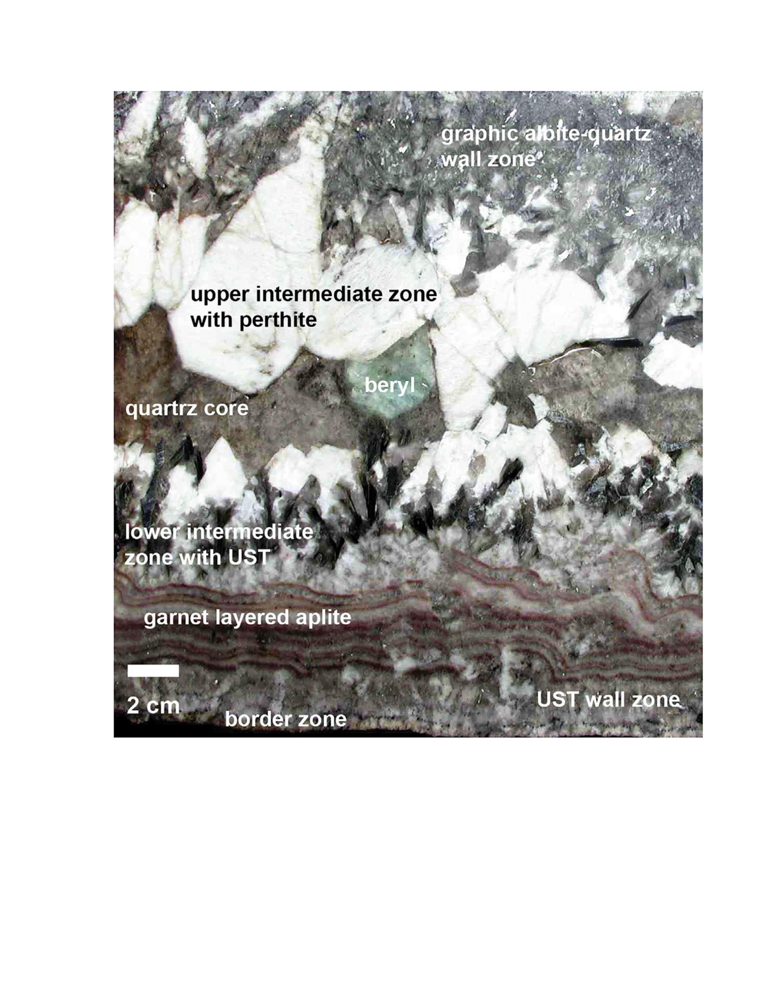

In [95]:
pages = convert_from_path('stock_mage_beryl.pdf', 310)

for page in pages:
    oo=page.save('out.jpg', 'JPEG')
    j=Image.open('out.jpg')
j

**<font size=4 >Preliminary work:</font>** 
* Investigate these data: 
    + check the size, look for (Nan,Null,None, empty values)
    + check random rows for missing data if not shown in the head or tail
    + filter data as need: such as Na's, list as values within a column
    + look at the data-types of the columns, determine if you may need to change (type)
    + Make a copy of the dataset if you need to retain the original
    + chunk data if there is a memory issue

In [56]:
mineral_deps=pd.read_csv('mrds.csv',low_memory=False,index_col=False) #consider chunking then do a loop 
mineral_deposit_original_data=mineral_deps.iloc[:,[1,4,5,6,8,9,11,12,13,14,19,23]] #,24,32,33]]


mineral_deposit_original_data.head()

,url,site_name,latitude,longitude,country,state,com_type,commod1,commod2,commod3,ore,work_type
0,https://mrdata.usgs.gov/mrds/show-mrds.php?dep...,Lookout Prospect,55.05612,-132.14344,United States,Alaska,M,Copper,"Gold, Silver",NaN,"Chalcopyrite, Covellite, Pyrite",NaN
1,https://mrdata.usgs.gov/mrds/show-mrds.php?dep...,Lucky Find Prospect,55.52751,-132.68514,United States,Alaska,M,Copper,Gold,NaN,"Chalcopyrite, Pyrite",Underground
2,https://mrdata.usgs.gov/mrds/show-mrds.php?dep...,Mccullough Prospect,55.97751,-132.99906,United States,Alaska,M,Copper,NaN,"Zinc, Gold","Chalcopyrite, Pyrite, Sphalerite",NaN
3,https://mrdata.usgs.gov/mrds/show-mrds.php?dep...,Lucky Jim Claim,55.52195,-132.68653,United States,Alaska,M,Gold,NaN,"Copper, Lead","Galena, Malachite, Pyrite",NaN
4,https://mrdata.usgs.gov/mrds/show-mrds.php?dep...,Matilda Occurrence,55.14556,-132.05233,United States,Alaska,M,Gold,NaN,NaN,Pyrite,NaN


In [55]:
#-------------------- Mineral_name_list-----------
rege=re.compile(r'[a-zA-Z_()]+')
mineral_list=pd.read_table('Mineral_name_list',index_col=False,header=None)
e=[]
mineral_list=mineral_list.apply(lambda x: x.astype(str).str.lower())
mineral_name_parse=re.sub(r'\([^)]*\)+', '',str(mineral_list))
p=mineral_name_parse.split()
y=' '.join(p)
ui=re.compile(r'([^\d])')
bb=ui.findall(y)

final_mineral_names=''.join(bb)

final_mineral_names=final_mineral_names.split()


#-------------------- Web-scrape another dataset for just minerals and append to other list-------
rsp = requests.get('https://www.minerals.net/Varieties-OtherNames/all.aspx')
rsp.status_code
soupify = bsopa(rsp.text, 'lxml')
f=soupify.get_text()[6391:24731]
f=f.replace('\n\n\n\n\xa0',' ')
minerals_new_file=f.split()

#---------------- Needed another list which has things not shown in final_mineral_names:

mineral_metal_list=pd.read_table('mineral_metal_list.txt',index_col=False,header=None)
mineral_metal=mineral_metal_list.apply(lambda x: x.astype(str).str.lower())
mineral_metal.columns=['names']
mineral_metal=list(mineral_metal.names.unique())

In [57]:
print(len(Minerals_consolidated_list))
print(len(z))

156
1354


In [58]:
top20_minerals

,QTY
Gold,63386
Stone,22624
Copper,19368
Iron,14128
Lead,12585
Silver,12063
Uranium,10367
Zinc,5979
Clay,5950
Manganese,4841


In [48]:
frq_min_dat

Counter({2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 1, 10: 1, 11: 1, 13: 1})

<center> **Welcome To Mineral Adjacency Lists with nested frequency** <center>

In [42]:
Mineral_adj_lst

defaultdict(list,
            {'Abrasive': [Counter({'Diamond': 2})],
             'Aggregate': [Counter({'Light Weight': 50})],
             'Alabaster': [Counter({'Gypsum-Anhydrite': 2})],
             'Aluminum': [Counter({'Iron': 18})],
             'Anthracite': [Counter({'Aluminum': 2})],
             'Antimony': [Counter({'Gold': 120,
                       'Iron': 2,
                       'Tungsten': 36,
                       'Fluorine-Fluorite': 4,
                       'Mercury': 40,
                       'Tin': 8,
                       'Graphite': 2})],
             'Arsenic': [Counter({'Gold': 36,
                       'Iron': 2,
                       'Tungsten': 6,
                       'Molybdenum': 2,
                       'Antimony': 8,
                       'Tin': 2})],
             'Asbestos': [Counter({'Iron': 4, 'Quartz': 2, 'Vermiculite': 2})],
             'Ash': [Counter({'Graphite': 2})],
             'Barium-Barite': [Counter({'Gold': 28,
            

In [38]:
show(p)


In [53]:
show(f)

<center> **CITATIONS** <center>

<https://mrdata.usgs.gov/mrds/> (Dataset)

<https://catalogue.data.gov.bc.ca/dataset/rock-properties-database>  (Main dataset extra resources)

<http://www.galleries.com/Minerals_By_Name>    

<https://www.minerals.net/MineralVarieties.aspx>

<https://stackoverflow.com/questions/1801668/convert-a-python-list-with-strings-all-to-lowercase-or-uppercase>

<https://stackoverflow.com/questions/37528373/how-to-remove-all-text-between-the-outer-parentheses-in-a-string>

<https://www.rexegg.com/regex-cookbook.html>

<https://minerals.usgs.gov/minerals/pubs/mapdata/>

<https://stackoverflow.com/questions/1720421/how-to-concatenate-two-lists-in-python>

<https://www.minerals.net/Varieties-OtherNames/all.aspx> (webscrape for mineral data)

<https://stackoverflow.com/questions/13779526/finding-a-substring-within-a-list-in-python> (substrings)

<https://stackoverflow.com/questions/30565759/get-unique-values-in-list-of-lists-in-python/30565803> (nested list Unique vals)

<https://geoffboeing.com/2015/10/exporting-python-data-geojson/> (create GEOJSON format from dataframe)

<https://stackoverflow.com/questions/40076241/how-to-calculate-counts-and-frequencies-for-pairs-in-list-of-lists>

<https://stackoverflow.com/questions/44734912/filter-out-elements-that-occur-less-times-than-a-minimum-threshold>

<https://www.geeksforgeeks.org/python-find-maximum-value-in-each-sublist/>

<https://stackoverflow.com/questions/7313157/python-create-list-of-tuples-from-lists>

<https://en.wikibooks.org/wiki/LaTeX/Tables#Basic_examples>(LaTex tables)

<https://stackoverflow.com/questions/46380568/how-to-create-a-stacked-bar-graph-from-nested-dictionary-in-python>

<https://bokeh.pydata.org/en/latest/docs/user_guide/categorical.html> (Vbar nested plot)

<https://stackoverflow.com/questions/9835762/how-do-i-find-the-duplicates-in-a-list-and-create-another-list-with-them>

< https://www.geeksforgeeks.org/python-find-all-triplets-in-a-list-with-given-sum/>

<https://www.youtube.com/watch?v=6Qs3wObeWwc>